In [1]:
import os,json,cortex
import numpy as np
from config.dir import DATA_DIR, REPO_DIR
from sklearn.preprocessing import StandardScaler
from voxelwise_tutorials.delayer import Delayer
from himalaya.kernel_ridge import KernelRidgeCV
from himalaya.backend import set_backend
from sklearn.pipeline import make_pipeline
from voxelwise_tutorials.utils import generate_leave_one_run_out
from sklearn.model_selection import check_cv
import matplotlib.pyplot as plt
from utils.npp import zscore

# Using a single session as a training 

In [2]:
subject = "sub-UTS02"
dir ='results/eng1000'
with open(os.path.join(REPO_DIR, dir,subject,'features_train.json'), "r") as f:
	X_train = json.load(f)
with open(os.path.join(REPO_DIR, dir,subject,'features_test.json'), "r") as f:
	X_test = json.load(f)
X_train = np.array(X_train, dtype=float)
X_test = np.array(X_test, dtype=float)
#X_train = np.vstack((X_train, X_train))
print("(n_samples_train, n_features) =", X_train.shape)
print("(n_samples_test, n_features) =", X_test.shape)

(n_samples_train, n_features) = (11414, 985)
(n_samples_test, n_features) = (291, 985)


# Subject 2 for training & testing

In [3]:
with open(os.path.join(REPO_DIR, dir,subject,'fmri_train.json'), "r") as f:
	Y_train = json.load(f)
with open(os.path.join(REPO_DIR, dir,subject,'fmri_test.json'), "r") as f:
	Y_test = json.load(f)
Y_train = np.array(Y_train, dtype=float)
Y_test= zscore(np.array(Y_test, dtype=float))
print("(n_samples_train, n_voxels) =", Y_train.shape)
print("( n_samples_test, n_voxels) =", Y_test.shape)

(n_samples_train, n_voxels) = (11414, 94251)
( n_samples_test, n_voxels) = (291, 94251)


In [4]:
print("Mean of features(train):",np.mean(X_train))
print("Standard deviation of features(train): ",np.std(X_train))
print("Mean of features(test) :",np.mean(X_test))
print("Standard deviation of features(test): ",np.std(X_test))

Mean of features(train): -7.513199163833951e-18
Standard deviation of features(train):  1.0
Mean of features(test) : -2.4590799932807207e-17
Standard deviation of features(test):  1.0


In [5]:
print("Mean of fmri(train):",np.mean(Y_train))
print("Standard deviation of fmri(train):",np.std(Y_train))
print("Mean of fmri(test):",np.mean(Y_test))
print("Standard deviation of fmri(test):",np.std(Y_test))

Mean of fmri(train): 1.163308154432966e-18
Standard deviation of fmri(train): 1.0
Mean of fmri(test): 3.1834090804837863e-18
Standard deviation of fmri(test): 1.0


In [6]:
with open(os.path.join(REPO_DIR, dir,subject,'run_on.json'), "r") as f:
	run_onsets = json.load(f)
len(run_onsets)

32

In [7]:
n_samples_train = X_train.shape[0]
cv = generate_leave_one_run_out(n_samples_train, run_onsets)
cv = check_cv(cv)  # copy the cross-validation splitter into a reusable list

In [8]:
X_train_= X_train.astype("float32")
alphas = np.logspace(1, 20, 20)

In [9]:
backend = set_backend("torch_cuda", on_error="warn")
print(backend)

<module 'himalaya.backend.torch_cuda' from '/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/backend/torch_cuda.py'>


# Create training model pipline 

In [10]:
pipeline = make_pipeline(
    StandardScaler(with_mean=True, with_std=False),
    Delayer(delays=[1, 2, 3, 4]),
    KernelRidgeCV(
        alphas=alphas, cv=cv,
        solver_params=dict(n_targets_batch=500, n_alphas_batch=5,
                           n_targets_batch_refit=100)),
)

In [11]:
_ = pipeline.fit(X_train, Y_train)

/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/kernel_ridge/_sklearn_api.py:490: UserWarning: Solving linear kernel ridge is slower than solving ridge when n_samples > n_features (here 11414 > 3940). Using himalaya.ridge.RidgeCV would be faster. Use warn=False to silence this warning.
  warnings.warn(
/home/ckj24/miniforge-pypy3/envs/fmri-algo/lib/python3.13/site-packages/himalaya/backend/_utils.py:138: UserWarning: GPU backend torch_cuda is much faster with single precision floats (float32), got input in torch.float64. Consider casting your data to float32.
  warnings.warn(


In [ ]:
# Import Joblib
import joblib

# Save the model to a file
joblib.dump(pipeline, os.path.join(REPO_DIR, dir,subject,'baseline_model.joblib'))
# Load the model using Joblib
loaded_model_joblib = joblib.load('model.joblib')

# Scores of training and testing data set

In [12]:
scores_train = pipeline.score(X_train, Y_train)
print("(n_voxels train,) =", scores_train.shape)
scores_test = pipeline.score(X_test, Y_test)
print("(n_voxels test,) =", scores_test.shape)

(n_voxels train,) = torch.Size([94251])
(n_voxels test,) = torch.Size([94251])


Text(0.5, 0, 'R-squared')

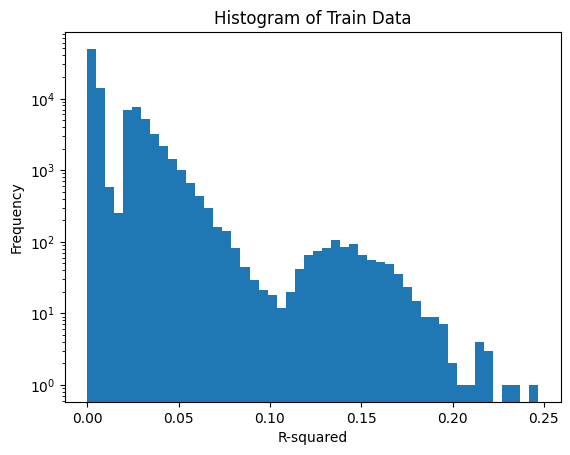

In [13]:
plt.hist(scores_train.cpu().numpy(), bins=50, log=True)
plt.title("Histogram of Train Data")
plt.ylabel("Frequency")
plt.xlabel("R-squared")

Text(0.5, 0, 'R-squared')

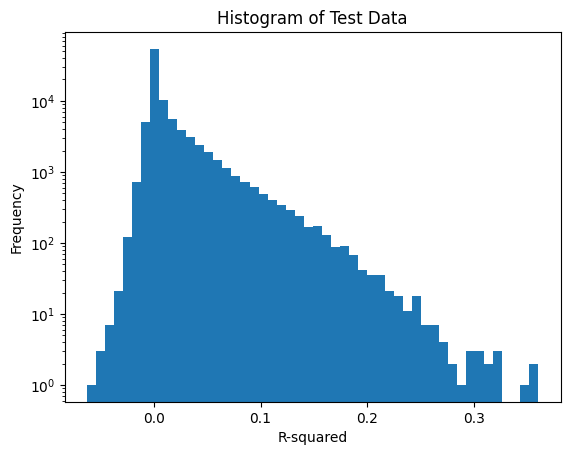

In [14]:
plt.hist(scores_test.cpu().numpy(), bins=50, log=True)
plt.title("Histogram of Test Data")
plt.ylabel("Frequency")
plt.xlabel("R-squared")

In [33]:
print("r-squared_average train =", np.mean(scores_train.cpu().numpy()).round(4))
print("r-squared_average =", np.mean(scores_test.cpu().numpy()).round(4))

r-squared_average train = 0.0135
r-squared_average = 0.0137


# Save trained data 

In [ ]:
#np.save(os.path.join(REPO_DIR, dir,subject,'scores_train'), scores_train.cpu().numpy())
#scores_train = np.load(os.path.join(REPO_DIR, dir,subject,'scores_train.npy'))
#np.save(os.path.join(REPO_DIR, dir,subject,'scores_test'), scores_test.cpu().numpy())
#scores_test = np.load(os.path.join(REPO_DIR, dir,subject,'scores_test.npy'))

# load data 

In [9]:
subject = "sub-UTS02"
dir ='results/eng1000'
#scores_train = np.load(os.path.join(REPO_DIR, dir,subject,'scores_train.npy'))
scores_test = np.load(os.path.join(REPO_DIR, dir,subject,'scores_test.npy'))

# plotting on pycortex

In [13]:
def set_pycortex_store(filestore):
    """Set the pycortex store to the specified directory."""
    cortex.database.default_filestore = filestore
    cortex.db.filestore = filestore
    cortex.db.reload_subjects()
    print(f"pycortex store set to {filestore}")


In [14]:
set_pycortex_store(os.path.join(DATA_DIR, 'ds003020/derivative/pycortex-db'))

pycortex store set to /home/ckj24/genevieve/ds003020/derivative/pycortex-db


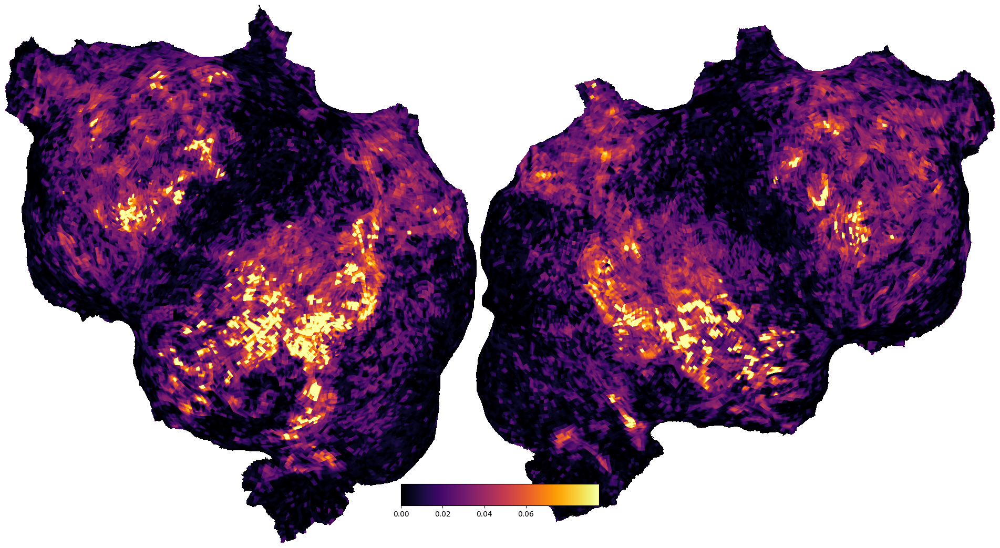

In [15]:
subject = 'UTS02'
xfm = 'UTS02_auto'

# First create example voxel data for this subject and transform
voxel_data = scores_train.cpu().numpy()
voxel_vol = cortex.Volume(voxel_data, subject, xfm,cmap="inferno")

# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm, 'line_nearest', recache=True)

# Just pass the voxel data through the mapper to get vertex data
vertex_map = mapper(voxel_vol)

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False)
plt.show()

Caching mapper...


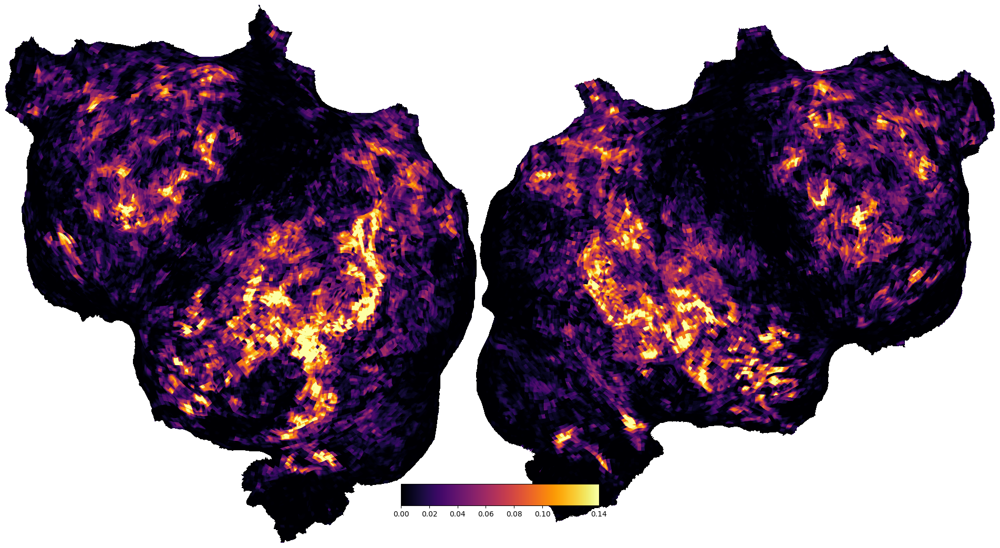

In [16]:
# First create example voxel data for this subject and transform
voxel_data = scores_test.cpu().numpy()
voxel_vol = cortex.Volume(voxel_data, subject, xfm,vmin=0,cmap="inferno")

# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm,  recache=True)

# Just pass the voxel data through the mapper to get vertex data
vertex_map = mapper(voxel_vol)

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False)
plt.show()

<Axes: xlabel='log10(alpha)', ylabel='Number of targets'>

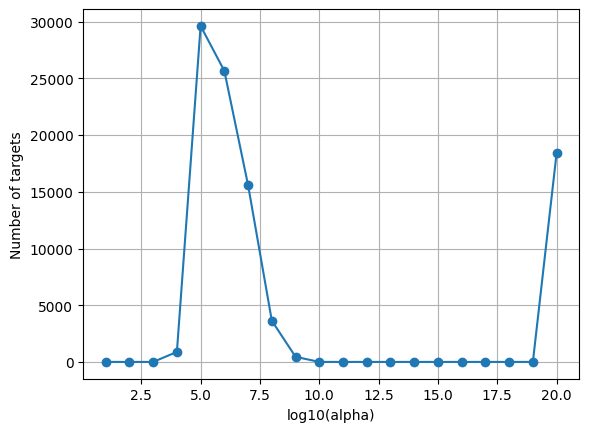

In [160]:
from himalaya.viz import plot_alphas_diagnostic
best_alphas = backend.to_numpy(pipeline[-1].best_alphas_)
plot_alphas_diagnostic(best_alphas=best_alphas, alphas=alphas)
#plt.show()

In [34]:
primal_coef = pipeline[-1].get_primal_coef()
primal_coef = backend.to_numpy(primal_coef)
print("(n_delays * n_features, n_voxels) =", primal_coef.shape)

(n_delays * n_features, n_voxels) = (3940, 94251)


In [35]:
primal_coef /= np.linalg.norm(primal_coef, axis=0)[None]
primal_coef *= np.sqrt(np.maximum(0, scores_test.cpu().numpy()))[None]

In [36]:
# split the ridge coefficients per delays
delayer = pipeline.named_steps['delayer']
primal_coef_per_delay = delayer.reshape_by_delays(primal_coef, axis=0)
print("(n_delays, n_features, n_voxels) =", primal_coef_per_delay.shape)
del primal_coef

# average over delays
average_coef = np.mean(primal_coef_per_delay, axis=0)
print("(n_features, n_voxels) =", average_coef.shape)
del primal_coef_per_delay

(n_delays, n_features, n_voxels) = (4, 985, 94251)
(n_features, n_voxels) = (985, 94251)


In [37]:
from sklearn.decomposition import PCA

pca = PCA(n_components=4)
pca.fit(average_coef.T)
components = pca.components_
print("(n_components, n_features) =", components.shape)

(n_components, n_features) = (4, 985)


In [23]:
print("PCA explained variance =", pca.explained_variance_ratio_)

PCA explained variance = [0.14468629 0.10472185 0.08799911 0.06027335]


In [ ]:
def print_voxel_words_pca(voxnum):
    # find_words_like_vec returns 10 words most correlated with the given vector, and the correlations
    voxwords = eng1000.find_words_like_vec(components[voxnum,:])
    print ("Best words for voxel %d :" % (voxnum))
    print(voxwords)

# PCA word representation

In [52]:
print_voxel_words_pca(0)
print_voxel_words_pca(1)
print_voxel_words_pca(2)
print_voxel_words_pca(3)


Best words for voxel 0 :
[(np.float64(0.4522039852108634), b'surface'), (np.float64(0.43453156798904), b'meters'), (np.float64(0.41561621772238017), b'approximately'), (np.float64(0.41187432516916017), b'layer'), (np.float64(0.40935346982892573), b'shafts'), (np.float64(0.4069707797871517), b'maximum'), (np.float64(0.4027381092371152), b'vertical'), (np.float64(0.39897054342881927), b'diameter'), (np.float64(0.39145922326126975), b'dome'), (np.float64(0.3855530362422059), b'metres')]
Best words for voxel 1 :
[(np.float64(0.3231232208019066), b'window'), (np.float64(0.31067885650504834), b'door'), (np.float64(0.2968338370664179), b'seconds'), (np.float64(0.28528175086715807), b'glanced'), (np.float64(0.2816218030472728), b'immediately'), (np.float64(0.27881887025851715), b'front'), (np.float64(0.27864157228491737), b'dropped'), (np.float64(0.27712621571613216), b'bounced'), (np.float64(0.27582752953164175), b'five'), (np.float64(0.27415212608196454), b'promptly')]
Best words for voxel 2

In [38]:
# transform with the fitted PCA
average_coef_transformed = pca.transform(average_coef.T).T
print("(n_components, n_voxels) =", average_coef_transformed.shape)
#del average_coef

# We make sure vmin = -vmax, so that the colormap is centered on 0.
vmax = np.percentile(np.abs(average_coef_transformed), 99.9)

(n_components, n_voxels) = (4, 94251)


# First component 
This flatmap shows in which brain regions the model has the largest projection on the first component. 

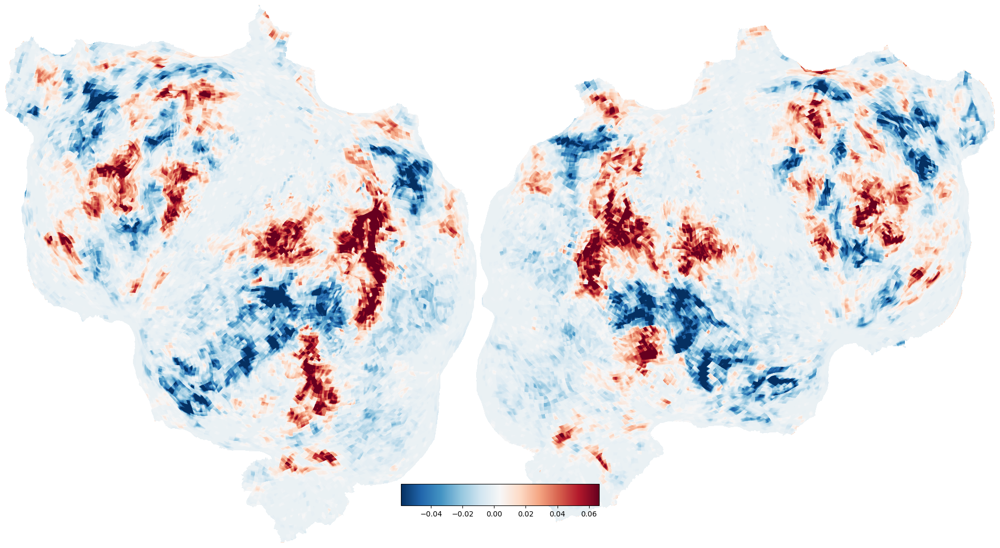

In [43]:
subject = 'UTS02'
# Then we have to get a mapper from voxels to vertices for this transform
mapper = cortex.get_mapper(subject, xfm, 'line_nearest', recache=True)
voxel_data = scores_train.cpu().numpy()
voxel_vol = cortex.Volume(average_coef_transformed[0], subject, xfm)
# Just pass the voxel data through the mapper to get vertex data

# You can plot both as you would normally plot Volume and Vertex data
cortex.quickshow(voxel_vol, with_rois=False, cmap='coolwarm')
plt.show()

# Creating rgb wordnet 

In [44]:
from voxelwise_tutorials.wordnet import scale_to_rgb_cube

voxel_colors = scale_to_rgb_cube(average_coef_transformed[1:4].T, clip=3).T
print("(n_channels, n_voxels) =", voxel_colors.shape)

(n_channels, n_voxels) = (3, 94251)


In [45]:
# Creating three cortex.Volume objects with the test data as np.uint8
subject = 'UTS02'
# Scaling the three datasets to be between 0-255
test1_scaled = voxel_colors[0] / np.max(voxel_colors[0]) * 255
test2_scaled = voxel_colors[1] / np.max(voxel_colors[1]) * 255
test3_scaled = voxel_colors[2] / np.max(voxel_colors[2]) * 255
red = cortex.Volume(test1_scaled.astype(np.uint8), subject, xfm)
green = cortex.Volume(test2_scaled.astype(np.uint8),  subject, xfm)
blue = cortex.Volume(test3_scaled.astype(np.uint8),  subject, xfm)

Background RRGGBBAA: ffffff00
Area 0:0:1883.83:1024 exported to 1884 x 1024 pixels (96 dpi)


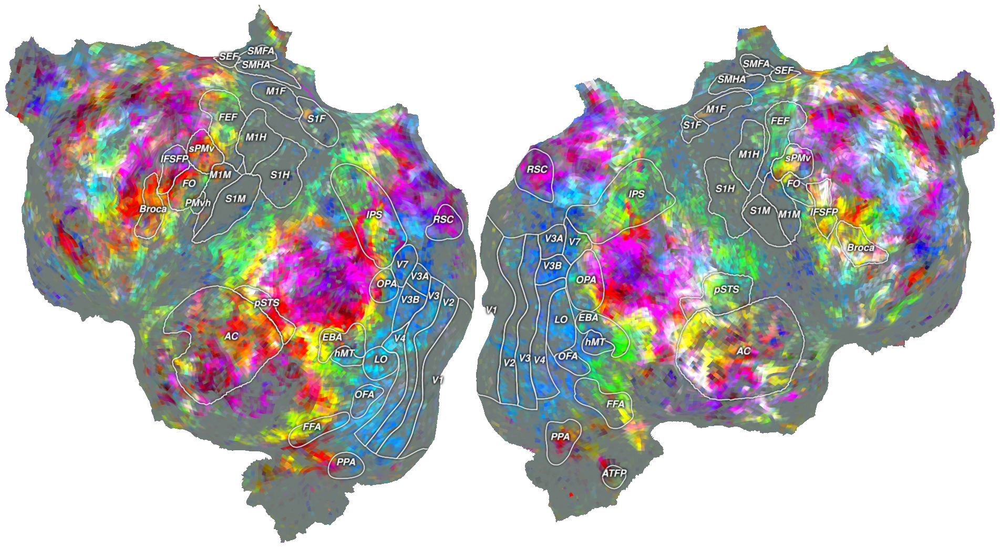

In [46]:
vol_data = cortex.VolumeRGB(red, green, blue, subject,vmin=0, vmax=1, vmin2=0, vmax2=1, vmin3=0, vmax3=1)
cortex.quickshow(vol_data, with_colorbar=False)
plt.show()

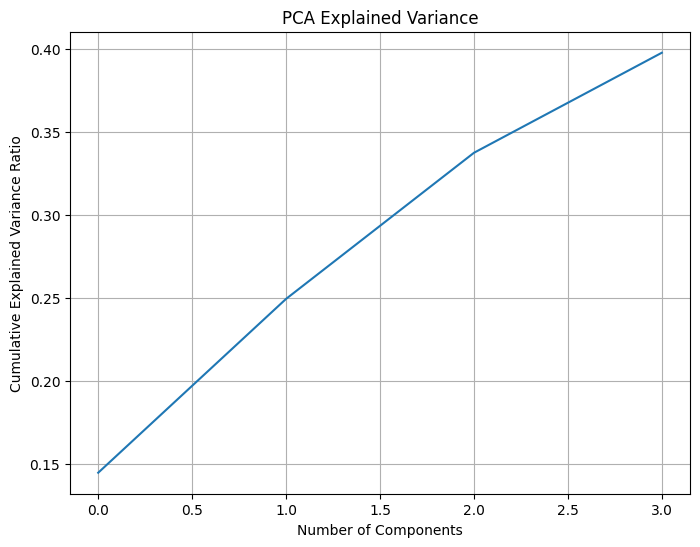

In [187]:
import matplotlib.pyplot as plt

# Plotting the explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('PCA Explained Variance')
plt.grid(True)
plt.show()

In [144]:
print("PCA explained variance =", pca.explained_variance_ratio_)

PCA explained variance = [0.14468629 0.10472185 0.08799911 0.06027335]


# Semantic model to get 10 most correlated words

In [26]:
# Load semantic model
# The SemanticModel class is something I wrote to make it easy to deal with vector-space semantic models.
from utils.SemanticModel import SemanticModel
from config.dir import EM_DATA_DIR 
eng1000 = SemanticModel.load(os.path.join(EM_DATA_DIR, "english1000sm.hf5"))

In [27]:
voxel_data = scores_test.cpu().numpy()
# Sort voxels by correlation so that we can pick a good voxel
# This will sort voxels in decreasing order of correlation
corrsort = np.argsort(voxel_data)[::-1]

In [28]:
def print_voxel_words(voxnum):
    # find_words_like_vec returns 10 words most correlated with the given vector, and the correlations
    voxwords = eng1000.find_words_like_vec(average_coef[:,voxnum])
    print ("Best words for voxel %d (correlation %0.3f):" % (voxnum, voxel_data[voxnum]))
    print(voxwords)

In [74]:
print_voxel_words(corrsort[0]) # best voxel
print_voxel_words(corrsort[14]) # 15th best voxel

Best words for voxel 29677 (correlation 0.360):
[(np.float64(0.21507490116707267), b'item'), (np.float64(0.20959563396564881), b'items'), (np.float64(0.20099260404698086), b'sheet'), (np.float64(0.19574242756634364), b'sheets'), (np.float64(0.19463326954169788), b'print'), (np.float64(0.193437986247053), b'container'), (np.float64(0.1915489119087555), b'coins'), (np.float64(0.18735022475616503), b'envelope'), (np.float64(0.18549637190315624), b'paper'), (np.float64(0.18513250805477524), b'rolls')]
Best words for voxel 31762 (correlation 0.287):
[(np.float64(0.10919390317258175), b'gotten'), (np.float64(0.10383641460161094), b'years'), (np.float64(0.09957209494158611), b'mothers'), (np.float64(0.0989603282312182), b'mankind'), (np.float64(0.09892463107296916), b'records'), (np.float64(0.09763574844168714), b'corporate'), (np.float64(0.09736254240502754), b'decade'), (np.float64(0.09551450004925126), b"mother's"), (np.float64(0.0953233649337162), b'danny'), (np.float64(0.0950921451739267

In [ ]:
# Plot histogram of correlations
from matplotlib.pyplot import figure, cm
f = figure(figsize=(8,8))
ax = f.add_subplot(1,1,1)
ax.hist(average_coef_transformed, 100) # histogram correlations with 100 bins
ax.set_xlabel("Correlation")
ax.set_ylabel("Num. voxels")